Before starting this notebook make sure that:
1. You have generated datasets for all models using the ../../dataset_generation/generation.sh script
2. You have trained your weights or taken already trained weights and placed them in the ../precalculated_weights folder
3. You have calculated the clip similarity for all models using the script ./calculate_similarity.sh

List of models:
    
    * google-siglip-base-patch16-224

    * google-siglip-base-patch16-256
    
    * google-siglip-base-patch16-384
    
    * google-siglip-base-patch16-512
    
    * google-siglip2-base-patch16-224
    
    * google-siglip2-base-patch16-256
    
    * google-siglip2-base-patch16-384
    
    * google-siglip2-base-patch16-512

In [1]:
import os

siglips = [
    'google-siglip-base-patch16-224',
    'google-siglip-base-patch16-256',
    'google-siglip-base-patch16-384',
    'google-siglip-base-patch16-512'
]

siglips2 = [
    'google-siglip2-base-patch16-224',
    'google-siglip2-base-patch16-256',
    'google-siglip2-base-patch16-384',
    'google-siglip2-base-patch16-512',
]

path = './results'

first_10 = 'first_10.png'
metrics_siglip_json = 'metrics_clip-10__google-siglip2-large-patch16-256.json'
metrics_clip_json = 'metrics_clip-10__openai-clip-vit-large-patch14.json'

model_names = os.listdir(path)

In [2]:
import os
import json
import numpy as np

siglips_siglip_pathes = [os.path.join(path, name, metrics_siglip_json) for name in siglips if '.ipynb' not in name]
siglips_siglip_sim = {}
for p in siglips_siglip_pathes:
    with open(p, 'r') as f:
        stat = json.load(f)['clip_sim']
        mean = np.mean(stat)
        std = np.std(stat)
        siglips_siglip_sim[p.split('/')[-2]] = (mean, std)

siglips_clip_pathes = [os.path.join(path, name, metrics_clip_json) for name in siglips if '.ipynb' not in name]
siglips_clip_sim = {}
for p in siglips_clip_pathes:
    with open(p, 'r') as f:
        stat = json.load(f)['clip_sim']
        mean = np.mean(stat)
        std = np.std(stat)
        siglips_clip_sim[p.split('/')[-2]] = (mean, std)



siglips2_siglip_pathes = [os.path.join(path, name, metrics_siglip_json) for name in siglips2 if '.ipynb' not in name]
siglips2_siglip_sim = {}
for p in siglips2_siglip_pathes:
    with open(p, 'r') as f:
        stat = json.load(f)['clip_sim']
        mean = np.mean(stat)
        std = np.std(stat)
        siglips2_siglip_sim[p.split('/')[-2]] = (mean, std)

siglips2_clip_pathes = [os.path.join(path, name, metrics_clip_json) for name in siglips2 if '.ipynb' not in name]
siglips2_clip_sim = {}
for p in siglips2_clip_pathes:
    with open(p, 'r') as f:
        stat = json.load(f)['clip_sim']
        mean = np.mean(stat)
        std = np.std(stat)
        siglips2_clip_sim[p.split('/')[-2]] = (mean, std)

In [3]:
from PIL import Image

siglip_image_pathes = [os.path.join(path, n, first_10) for n in siglips if '.ipynb' not in n]
siglip_images = {}
for p in siglip_image_pathes:
    with open(p, 'r') as f:
        siglip_images[p.split('/')[-2]] = Image.open(p).convert('RGB')

siglip2_image_pathes = [os.path.join(path, n, first_10) for n in siglips2 if '.ipynb' not in n]
siglip2_images = {}
for p in siglip2_image_pathes:
    with open(p, 'r') as f:
        siglip2_images[p.split('/')[-2]] = Image.open(p).convert('RGB')

In [4]:
siglip_np_images = [np.asarray(siglip_images[n])[600:-600, 90:-90] for n in siglips]
siglip_recs = np.concatenate(siglip_np_images, axis=1)

siglip2_np_images = [np.asarray(siglip2_images[n])[600:-600, 90:-90] for n in siglips2]
siglip2_recs = np.concatenate(siglip2_np_images, axis=1)

The graph below may differ from the graph from the article because it is plotted using only 10 examples. 
However, even for the ten examples, we can see that:
1. siglip2 beats siglip in all cases.
2. As the resolution of the phyche tensor increases, the quality of the reconstruction increases.

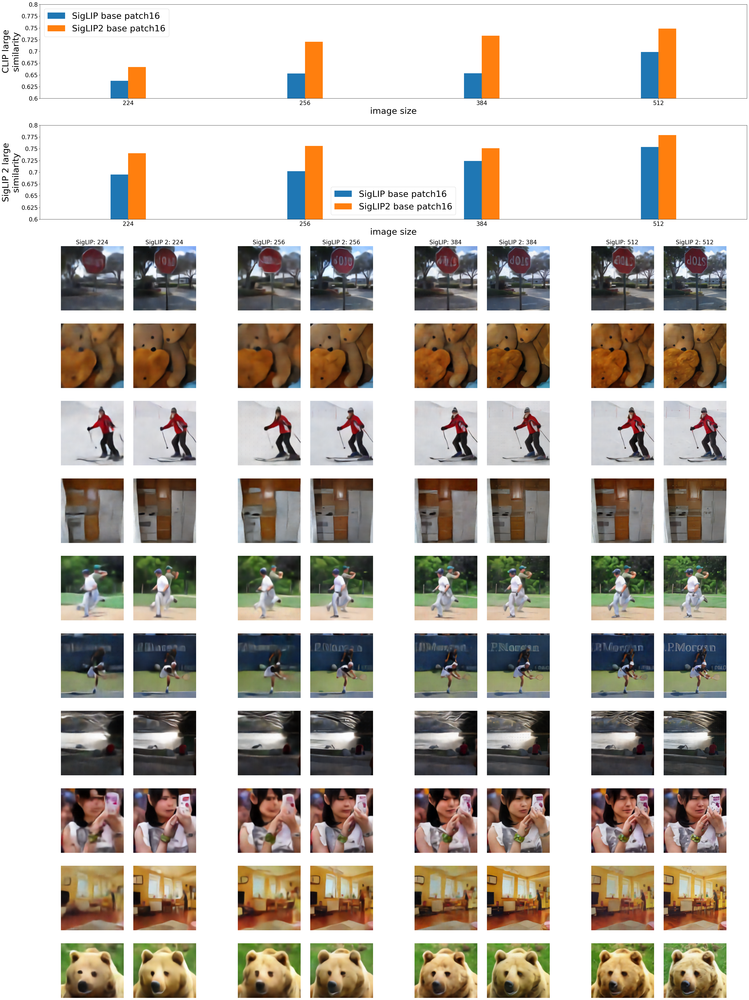

In [5]:
import matplotlib.pyplot as plt
import numpy as np

ncols, nrows, scale = 12, 16, 3
fig = plt.figure(figsize=(ncols * scale, nrows * scale))
gs_main = fig.add_gridspec(3, 1, height_ratios=[1, 1, 8])
#################################################################################
#################################################################################
#################################################################################
ax_top = plt.subplot(gs_main[0])
width=0.1
ax_top.bar([n - width / 2 for n in range(len(siglips))],
        [siglips_clip_sim[n][0] for n in siglips],
        width=width, label='SigLIP base patch16')
ax_top.bar([n + width / 2 for n in range(len(siglips2))],
        [siglips2_clip_sim[n][0] for n in siglips2],
        width=width, label='SigLIP2 base patch16')
ax_top.set_yticks(np.arange(0.6, 0.8, 0.025).round(3), np.arange(0.6, 0.8, 0.025).round(3), fontsize=20)
ax_top.set_xticks([n for n in range(len(siglips))], [n.split('-')[-1] for n in siglips], fontsize=20)

ax_top.set_xlim(-0.5, 3.5)
ax_top.set_ylim(0.6, 0.8)
ax_top.set_xlabel('image size', fontsize=30)
ax_top.set_ylabel('CLIP large\nsimilarity', fontsize=30)
ax_top.legend(fontsize=30)

#################################################################################
#################################################################################
#################################################################################
ax_medium = plt.subplot(gs_main[1])
width=0.1
ax_medium.bar([n - width / 2 for n in range(len(siglips))],
        [siglips_siglip_sim[n][0] for n in siglips],
        width=width, label='SigLIP base patch16')
ax_medium.bar([n + width / 2 for n in range(len(siglips2))],
        [siglips2_siglip_sim[n][0] for n in siglips2],
        width=width, label='SigLIP2 base patch16')
ax_medium.set_yticks(np.arange(0.6, 0.8, 0.025).round(3), np.arange(0.6, 0.8, 0.025).round(3), fontsize=20)
ax_medium.set_xticks([n for n in range(len(siglips))], [n.split('-')[-1] for n in siglips], fontsize=20)

ax_medium.set_xlim(-0.5, 3.5)
ax_medium.set_ylim(0.6, 0.8)
ax_medium.set_xlabel('image size', fontsize=30)
ax_medium.set_ylabel('SigLIP 2 large\nsimilarity', fontsize=30)
ax_medium.legend(fontsize=30)

#################################################################################
#################################################################################
#################################################################################
d, p = 0.4, 0.2
gs_bottom = gs_main[2].subgridspec(1, 13, width_ratios=[p, 1, 1, d, 1, 1, d, 1, 1, d, 1, 1, p], wspace=0.1)

#################################################################################
siglip_np_images = [np.asarray(siglip_images[n])[600:-600, 90:-90] for n in siglips]
siglip_recs = np.concatenate(siglip_np_images, axis=1)
for i, name, im in zip([0, 3, 6, 9], ['SigLIP: 224', 'SigLIP: 256', 'SigLIP: 384', 'SigLIP: 512'],siglip_np_images):
    ax2 = fig.add_subplot(gs_bottom[0, i + 1])
    ax2.imshow(im)
    ax2.set_title(name, fontsize=20)
    ax2.axis('off')

#################################################################################
siglip2_np_images = [np.asarray(siglip2_images[n])[600:-600, 90:-90] for n in siglips2]
siglip2_recs = np.concatenate(siglip2_np_images, axis=1)
for i, name, im in zip([1, 4, 7, 10], ['SigLIP 2: 224', 'SigLIP 2: 256', 'SigLIP 2: 384', 'SigLIP 2: 512'], siglip2_np_images):
    ax2 = fig.add_subplot(gs_bottom[0, i + 1])
    ax2.imshow(im)
    ax2.set_title(name, fontsize=20)
    ax2.axis('off')

plt.tight_layout()
plt.show()
